# Multi-head Attention

![Screenshot 2025-09-08 at 19.35.41.png](<attachment:Screenshot 2025-09-08 at 19.35.41.png>)
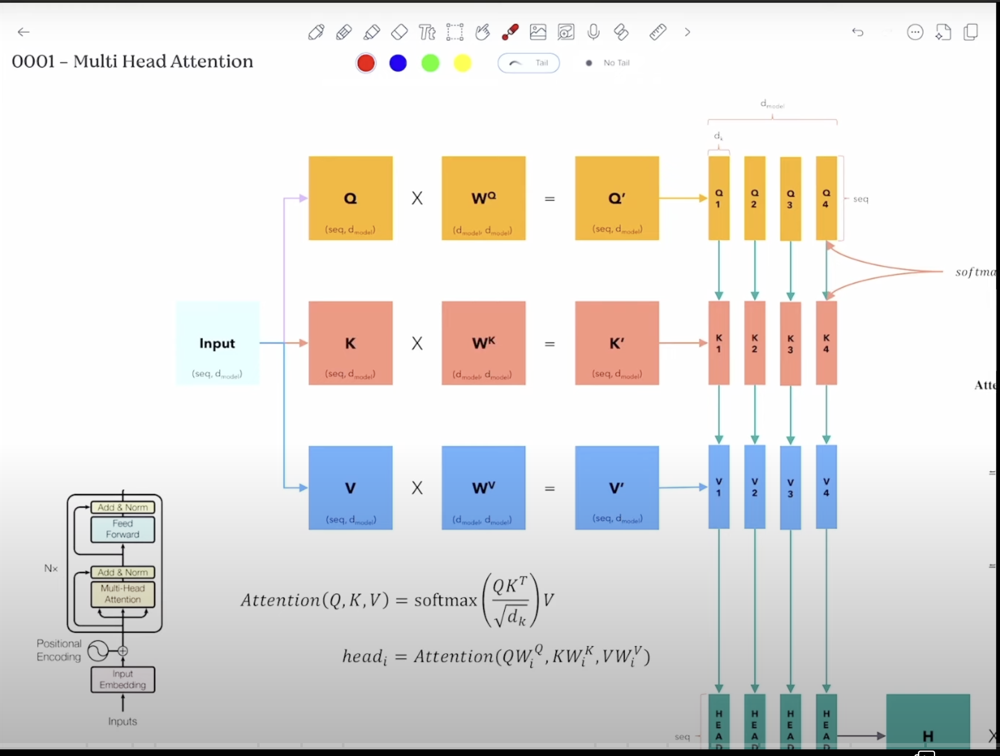

#### MHA starts with single input sequence or two input sequence  in regard to cross head attention

-------------------------------------------------------------------
When we talk about **multi-head attention**, we’re dealing with two main contexts:

1. **Self-Attention**

   * This starts with a **single input sequence** (for example, a sentence: *“The cat sat on the mat”*).
   * The same sequence is used to generate **queries (Q), keys (K), and values (V)**.
   * Each token (like *“cat”*) attends to all other tokens in that same sequence.
   * Example: in *“The cat sat”*, the word *“cat”* might pay more attention to *“sat”* than *“the”*.

2. **Cross-Attention**

   * This involves **two input sequences**.
   * Common in encoder-decoder architectures (like in Transformers for translation).
   * One sequence (say, from the encoder = source sentence in French) provides the **keys (K) and values (V)**.
   * The other sequence (say, from the decoder = English being generated) provides the **queries (Q)**.
   * This allows the decoder to “look at” the encoder’s sequence while generating output.

---

### So in short:

* **Self-attention (single sequence):** Q, K, V all come from the **same sequence**.
* **Cross-attention (two sequences):** Q comes from the **decoder sequence**, while K and V come from the **encoder sequence**.

And **multi-head** just means we do this in parallel with multiple sets of Q/K/V projections, so the model can capture different types of relationships (e.g., syntax, semantics, long-distance dependencies).


-------------------------------------------------------------------------

#### our input seq is (seq, d_model) : where seq is number of sequences/tokens and each seq is represeneted by an embedding vector with d_model  dimensions 

-------------------------------------------------------------------------

Exactly ✅ you’ve got the shape right. Let’s unpack this carefully with respect to **multi-head attention**.

---

### Input Representation

* You start with a batch of tokens (let’s ignore batch size for now).
* The input tensor is:

$$
X \in \mathbb{R}^{(\text{seq\_len}, d_\text{model})}
$$

where:

* **seq\_len** = number of tokens in the sequence
* **d\_model** = embedding dimension (e.g., 512 or 768 in Transformers)

So each token is a row vector of size $d_\text{model}$.

---

### In **Self-Attention**

We project the same input $X$ three different ways to get **Q, K, V**:

$$
Q = XW_Q, \quad K = XW_K, \quad V = XW_V
$$

where $W_Q, W_K, W_V \in \mathbb{R}^{d_\text{model} \times d_k}$.

* So all queries, keys, and values are derived from the **same sequence**.
* Shapes:

  * $Q, K, V \in \mathbb{R}^{(\text{seq\_len}, d_k)}$

Then attention is computed as:

$$
\text{Attention}(Q, K, V) = \text{softmax}\left(\frac{QK^T}{\sqrt{d_k}}\right)V
$$

---

### In **Cross-Attention**

We have **two sequences**:

* Decoder input (say, partially generated English translation): $X_{dec} \in \mathbb{R}^{(\text{seq\_len}^{dec}, d_\text{model})}$
* Encoder output (say, processed French sentence): $X_{enc} \in \mathbb{R}^{(\text{seq\_len}^{enc}, d_\text{model})}$

We then project them differently:

$$
Q = X_{dec}W_Q, \quad K = X_{enc}W_K, \quad V = X_{enc}W_V
$$

* Queries come from the **decoder sequence**.
* Keys & values come from the **encoder sequence**.
* Shapes:

  * $Q \in \mathbb{R}^{(\text{seq\_len}^{dec}, d_k)}$
  * $K, V \in \mathbb{R}^{(\text{seq\_len}^{enc}, d_k)}$

This way, the decoder tokens can attend to the entire encoder sequence.

---

### Multi-Head Part

Instead of doing this once, we split $d_\text{model}$ into multiple “heads”:

* Suppose $d_\text{model} = 512$, number of heads = 8.
* Then each head works with $d_k = d_v = 64$.
* We compute attention **in parallel** for each head and then concatenate results:

$$
\text{MultiHead}(Q,K,V) = \text{Concat}(head_1, \ldots, head_h)W_O
$$

---

👉 So your intuition was correct:

* **Shape starts as (seq\_len, d\_model)**.
* In **self-attention**, Q, K, V all come from the same input.
* In **cross-attention**, Q comes from one sequence (decoder), while K and V come from another (encoder).




#### W_q, W_k and W_v are all represented by linear layers  and these layers are (d_model, d_model), so they dont change the shape of input tensor 


![Screenshot 2025-09-08 at 22.58.55.png](<attachment:Screenshot 2025-09-08 at 22.58.55.png>)

in practice, **$W_Q$, $W_K$, $W_V$ are implemented as linear (dense) layers with weight matrices of shape**

$$
(d_\text{model}, d_\text{model})
$$

That means if your input tensor is

$$
X \in \mathbb{R}^{(\text{seq\_len}, d_\text{model})}
$$

then

$$
Q = XW_Q, \quad K = XW_K, \quad V = XW_V
$$

all have **the same shape**:

$$
Q, K, V \in \mathbb{R}^{(\text{seq\_len}, d_\text{model})}
$$

---

### But where does $d_k$ and $d_v$ come in then?

That happens when we **split into heads**.

* Let’s say:

  * $d_\text{model} = 512$
  * Number of heads $h = 8$
  * Then each head works on subspaces of size:

  $$
  d_k = d_v = \frac{d_\text{model}}{h} = 64
  $$

* After computing $Q, K, V \in (\text{seq\_len}, d_\text{model})$,
  we **reshape** them into

  $$
  (\text{seq\_len}, h, d_k)
  $$

* Attention is computed **per head** on the $d_k$-dimensional slices.

---

### Workflow Recap

1. Input:

   $$
   X \in (\text{seq\_len}, d_\text{model})
   $$

2. Linear projections (no shape change):

   $$
   Q, K, V \in (\text{seq\_len}, d_\text{model})
   $$

3. Reshape/split into heads:

   $$
   Q, K, V \in (\text{seq\_len}, h, d_k), \quad d_k = d_\text{model}/h
   $$

4. Scaled dot-product attention per head:

   $$
   \text{Attention}_i(Q,K,V) \in (\text{seq\_len}, d_v), \quad d_v = d_k
   $$

5. Concatenate across heads:

   $$
   \text{Concat}(head_1,\dots,head_h) \in (\text{seq\_len}, d_\text{model})
   $$

6. Final linear projection $W_O \in (d_\text{model}, d_\text{model})$ to mix head outputs.

---

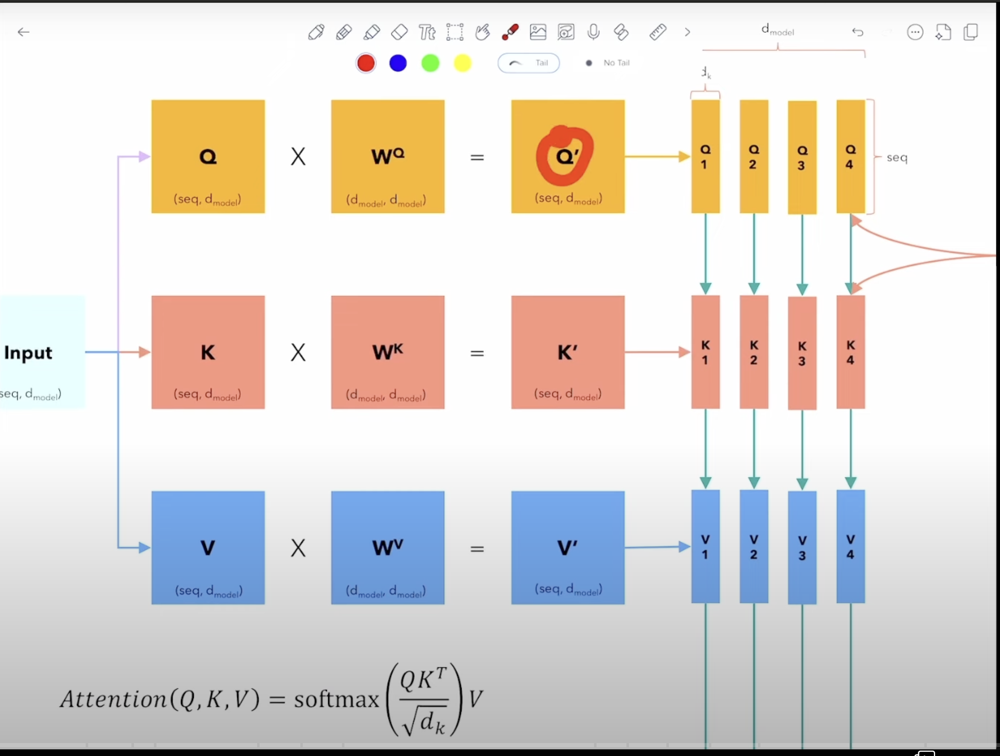

#### then we divide Q`, K` and V` in smaller embeddings 

![Screenshot 2025-09-08 at 23.03.27.png](<attachment:Screenshot 2025-09-08 at 23.03.27.png>)


----------------------------------------------------------------------------
### Step 1 — Start with projections

We project the input with $W_Q, W_K, W_V$, each of size $(d_\text{model}, d_\text{model})$:

$$
Q', K', V' \in \mathbb{R}^{(\text{seq\_len}, d_\text{model})}
$$

At this point, they still have the **same dimension** as the input.

---

### Step 2 — Split into heads

Now, let’s assume:

* $d_\text{model} = 512$
* Number of heads $h = 8$
* Then each head gets:

$$
d_k = d_v = \frac{d_\text{model}}{h} = 64
$$

We reshape:

$$
Q', K', V' \;\; \to \;\; ( \text{seq\_len}, h, d_k )
$$

So for each token, instead of one $512$-dim vector, you now have **8 parallel 64-dim sub-vectors** — one per head.

---

### Step 3 — Attention per head

For each head $i$:

$$
\text{Attention}_i(Q_i, K_i, V_i) = \text{softmax}\!\left(\frac{Q_i K_i^T}{\sqrt{d_k}}\right) V_i
$$

Output shape per head:

$$
(\text{seq\_len}, d_v)
$$

---

### Step 4 — Concatenate heads

We concatenate all head outputs back together:

$$
\text{Concat}(head_1, \dots, head_h) \in (\text{seq\_len}, d_\text{model})
$$

---

### Step 5 — Final linear layer

A last linear projection $W_O \in (d_\text{model}, d_\text{model})$ mixes the head information.

---

So when you say:

> “then we divide Q’, K’, V’ in smaller embeddings”

that is **precisely the reshaping into $(seq\_len, h, d_k)$**, where each smaller embedding is what each attention head works on.

---

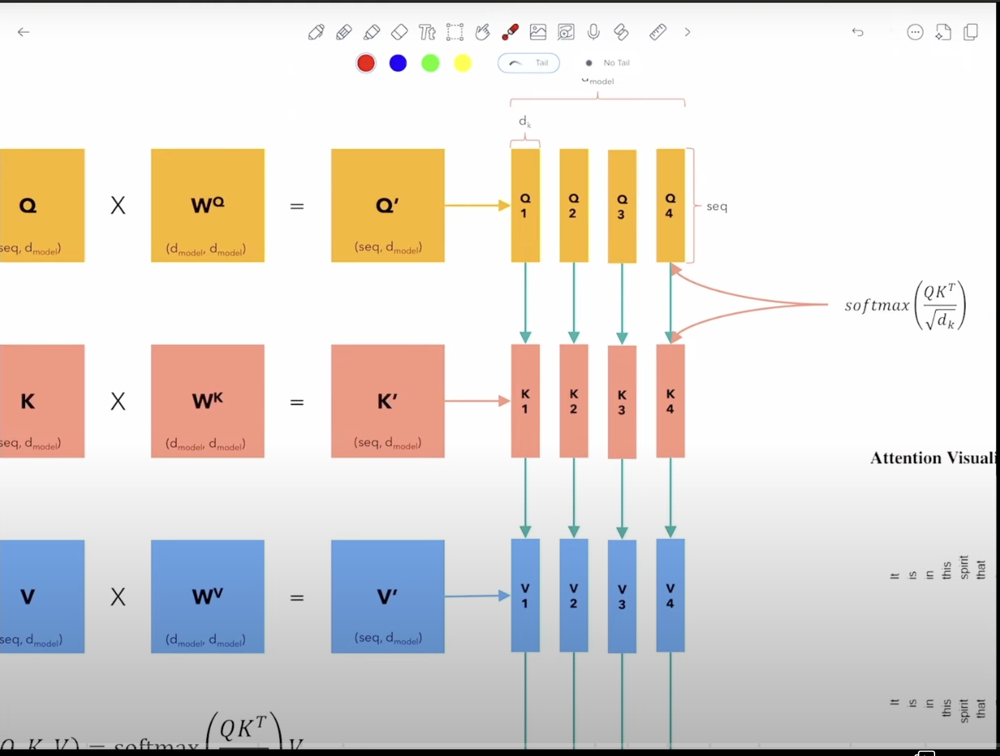

![Screenshot 2025-09-10 at 19.19.54.png](<attachment:Screenshot 2025-09-10 at 19.19.54.png>)
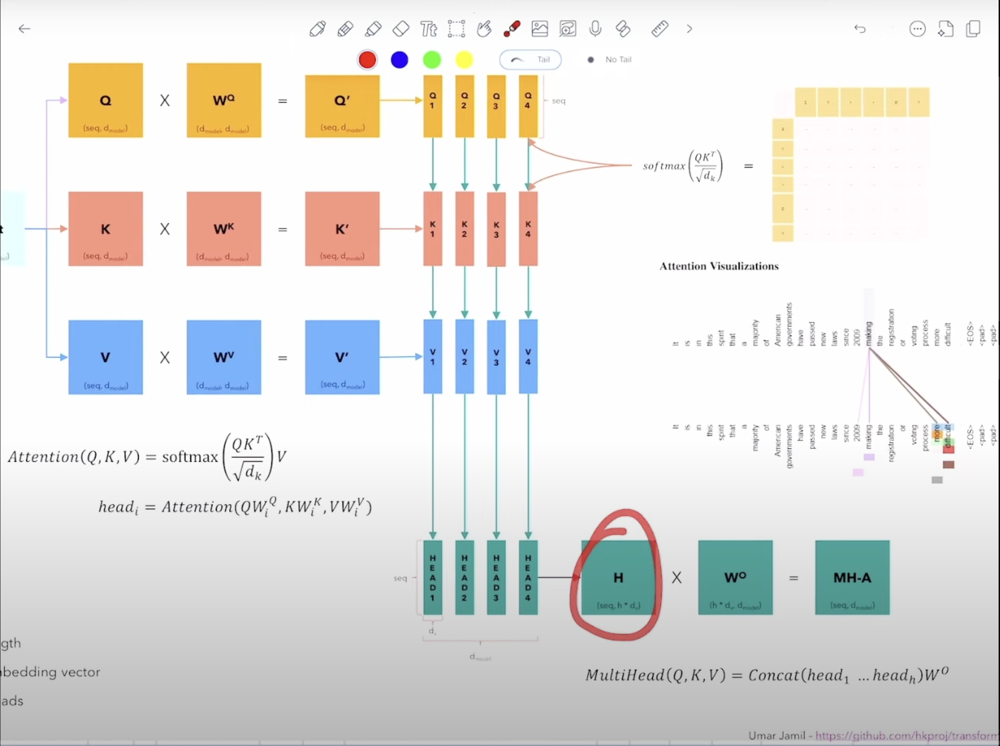

iNice — let’s take this all the way down to the bones. I’ll explain what $QK^\top$ actually is, what each number means, why we divide by $\sqrt{d_k}$, what softmax does, and how the result is used to compute the final outputs. I’ll include a small numeric example so you can see the numbers change step-by-step.

# 1) What is $QK^\top$? (shape and element meaning)

* Suppose
  $Q \in \mathbb{R}^{\text{(seq\_len\_q)}\times d_k}$ and
  $K \in \mathbb{R}^{\text{(seq\_len\_k)}\times d_k}$.
  Then

  $$
  QK^\top \in \mathbb{R}^{\text{(seq\_len\_q)}\times \text{(seq\_len\_k)}}.
  $$

* **Element interpretation:** the entry $(i,j)$ of $S = QK^\top$ is

  $$
  S_{i,j} = Q_i \cdot K_j
  $$

  (the dot product between query vector $Q_i$ and key vector $K_j$).
  So $S_{i,j}$ is a *compatibility score* (how much query token $i$ “matches” key token $j$).

* If you are doing **self-attention** then seq\_len\_q = seq\_len\_k and $S$ is square; for **cross-attention** they can be different lengths and $S$ is rectangular.

# 2) Geometric intuition for the dot product

* $Q_i\cdot K_j = \|Q_i\|\|K_j\|\cos(\theta_{ij})$.
  So it’s large when:

  * the two vectors point in roughly the same direction (high cosine), and/or
  * they have large magnitudes.
* If you normalize vectors (or use small magnitudes), the dot product approximates *cosine similarity*.

# 3) Why divide by $\sqrt{d_k}$?

* If components of $Q$ and $K$ are roughly independent with variance $\sigma^2$, then the variance of the dot product grows roughly like $d_k \sigma^2$. So for larger $d_k$ the raw dot products have larger magnitudes.
* Large magnitudes → softmax outputs become very “peaky” (almost one-hot), which:

  * reduces gradient signal (bad for training), and
  * makes optimization unstable.
* Dividing by $\sqrt{d_k}$ normalizes the scale: it keeps the variance of the logits roughly constant as $d_k$ changes. So we use

  $$
  \text{scores} = \frac{QK^\top}{\sqrt{d_k}}.
  $$

  This is effectively a temperature normalization for the softmax.

# 4) Softmax: turning scores into attention weights

* After scaling we apply softmax **row-wise** (for each query $i$):

  $$
  A_{i,:} = \text{softmax}\!\bigg(\frac{Q_i K^\top}{\sqrt{d_k}}\bigg).
  $$
* Each row $A_{i,:}$ is a probability distribution over the keys: non-negative and sums to 1. So $A_{i,j}$ tells you *what fraction of attention* query $i$ gives to key $j$.

# 5) Using the attention weights

* The final per-query output is the weighted sum of the value vectors $V$:

  $$
  \text{output}_i = \sum_{j} A_{i,j}\, V_j.
  $$

  In matrix form: $\text{Output} = A V$.
  So attention = compute compatibility (QKᵀ) → normalize (softmax) → form weighted sum of values.

# 6) A concrete numeric toy example (step-by-step)

Take a tiny example so you can see numbers:

* Let $d_k=2$.
  $Q = \begin{bmatrix}1&0\\[2pt]0&1\\[2pt]1&1\end{bmatrix},\quad
   K = \begin{bmatrix}1&0\\[2pt]1&1\\[2pt]0&1\end{bmatrix}.$

1. Compute $S=QK^\top$ (3×3):

   $$
   S = \begin{bmatrix}
   1 & 1 & 0\\[2pt]
   0 & 1 & 1\\[2pt]
   1 & 2 & 1
   \end{bmatrix}.
   $$

2. Scale by $\sqrt{d_k}=\sqrt{2}\approx1.4142$:

   $$
   S/\sqrt{d_k} \approx
   \begin{bmatrix}
   0.7071 & 0.7071 & 0.0000\\
   0.0000 & 0.7071 & 0.7071\\
   0.7071 & 1.4142 & 0.7071
   \end{bmatrix}.
   $$

3. Apply softmax row-wise (exponentiate each entry and normalize by the row sum). The attention matrix becomes

   $$
   A \approx
   \begin{bmatrix}
   0.4011 & 0.4011 & 0.1978\\
   0.1978 & 0.4011 & 0.4011\\
   0.2483 & 0.5035 & 0.2483
   \end{bmatrix}.
   $$

   * Interpret row 3: query 3 attends about 50% to key 2 and \~25% to keys 1 and 3.

4. Then multiply by $V$ (whatever your value vectors are) to get outputs — each output is a convex combination of the value vectors.

# 7) Practical details & extra points

* **Masking:** before softmax you can add $-\infty$ (or a very large negative) to positions you want to block (causal masks for masking future tokens, padding masks). That makes their softmax weight ≈ 0.
* **Multi-head:** the same process happens per head with smaller $d_k$ (usually $d_k = d_\text{model}/h$). Each head produces its own attention matrix; head outputs are concatenated and linearly mixed.
* **Alternatives:** additive attention (Bahdanau) uses an MLP instead of dot product. Dot-product attention is fast and parallelizable.
* **Interpretability:** the softmaxed matrix $A$ is often shown as a heatmap — it’s a direct visualization of which tokens each query focuses on.

# 8) Short summary

* $QK^\top$ = matrix of raw compatibility scores (dot products) between queries and keys.
* Divide by $\sqrt{d_k}$ to keep the logits well scaled (prevents softmax saturation).
* Apply softmax row-wise → get attention weights (rows sum to 1).
* Multiply those weights with $V$ → weighted sums = final attended outputs.

If you want, I can:

* show the same worked example with actual $V$ and the final outputs; or
* draw a tiny diagram showing how a single query row picks values — whichever helps you most.


Perfect — let’s do a **full flow with a concrete example** so you see exactly how the numbers propagate from **Q, K, V** → $QK^\top$ → scaling → softmax → final weighted sum.

---

## Example Setup

Let’s keep it tiny:

* Sequence length: **3 tokens**
* Head dimension: $d_k = d_v = 2$

So each token has a 2-dim query/key/value vector.

$$
Q = \begin{bmatrix}
1 & 0 \\ 
0 & 1 \\
1 & 1
\end{bmatrix}, \quad
K = \begin{bmatrix}
1 & 0 \\ 
1 & 1 \\
0 & 1
\end{bmatrix}, \quad
V = \begin{bmatrix}
1 & 0 \\ 
0 & 2 \\
3 & 1
\end{bmatrix}
$$

---

## Step 1 — Compute $QK^\top$

Dot product of every query with every key:

$$
QK^\top =
\begin{bmatrix}
1 & 1 & 0 \\
0 & 1 & 1 \\
1 & 2 & 1
\end{bmatrix}
$$

Shape: $(3,3)$ = queries × keys

* Row 1 = similarity of **query 1** with all keys
* Row 2 = similarity of **query 2** with all keys
* Row 3 = similarity of **query 3** with all keys

---

## Step 2 — Scale by $\sqrt{d_k} = \sqrt{2} \approx 1.414$

$$
S = \frac{QK^\top}{\sqrt{2}} \approx
\begin{bmatrix}
0.71 & 0.71 & 0.00 \\
0.00 & 0.71 & 0.71 \\
0.71 & 1.41 & 0.71
\end{bmatrix}
$$

This keeps scores in a reasonable range.

---

## Step 3 — Softmax row-wise

Apply softmax to each row (normalize across keys):

$$
A \approx
\begin{bmatrix}
0.401 & 0.401 & 0.198 \\
0.198 & 0.401 & 0.401 \\
0.248 & 0.503 & 0.248
\end{bmatrix}
$$

* Row 1: query 1 attends equally to key 1 and 2 (\~40% each), less to key 3 (\~20%).
* Row 2: query 2 splits \~40% on keys 2 & 3, \~20% on key 1.
* Row 3: query 3 focuses strongly on key 2 (\~50%).

---

## Step 4 — Multiply with $V$

Now compute output = $AV$:

$$
\text{Output} = A \times V
$$

Carry out multiplication:

$$
\text{Output} =
\begin{bmatrix}
0.401 & 0.401 & 0.198 \\
0.198 & 0.401 & 0.401 \\
0.248 & 0.503 & 0.248
\end{bmatrix}
\times
\begin{bmatrix}
1 & 0 \\
0 & 2 \\
3 & 1
\end{bmatrix}
$$

$$
\text{Output} \approx
\begin{bmatrix}
0.995 & 1.198 \\
1.401 & 1.604 \\
1.997 & 2.005
\end{bmatrix}
$$

---

## Step 5 — Interpret

* **Token 1 output** ≈ $[0.995, 1.198]$: it blended mostly values from token 1 and 2.
* **Token 2 output** ≈ $[1.401, 1.604]$: a mix of token 2 and 3’s values.
* **Token 3 output** ≈ $[1.997, 2.005]$: heavily influenced by token 2 (since it paid \~50% attention there).

So the **attention mechanism let each token recompute its representation as a weighted mixture of all token values** — with weights determined by query–key similarity.

---

👉 Do you want me to also **draw a mini diagram** (like a heatmap of the attention matrix $A$) so you can *see* how each query spreads its attention across keys?


# Scaled dot product 

Great observation 👍 — let’s get very precise about this:

### 1. Dot Product vs Cosine Similarity

* The raw score in **scaled dot-product attention** is:

  $$
  s_{i,j} = \frac{Q_i \cdot K_j}{\sqrt{d_k}}
  $$
* The **cosine similarity** between $Q_i$ and $K_j$ is:

  $$
  \cos(\theta_{i,j}) = \frac{Q_i \cdot K_j}{\|Q_i\|\|K_j\|}
  $$

So:

* Dot product = similarity **scaled by vector lengths**.
* Cosine similarity = similarity **independent of vector lengths**.

---

### 2. Why not normalize (cosine)?

If we normalized $Q$ and $K$ to unit length, then scaled dot-product attention would basically *be* cosine similarity (up to a constant).
But in Transformers we **don’t normalize them** because:

* Keeping magnitudes lets the model learn to emphasize or de-emphasize tokens via length.
* Scaling by $\sqrt{d_k}$ stabilizes training without throwing away magnitude information.

---

### 3. So what does attention compute?

* It’s not exactly cosine similarity.
* It’s **a learned similarity measure**:

  * If the model wants cosine-like behavior, it can normalize implicitly (by controlling norms of queries/keys through training).
  * But it also has the flexibility to let longer vectors dominate when needed.

---

### 4. Geometric view

* Without normalization: similarity is like **cosine × magnitude factor**.
* After dividing by $\sqrt{d_k}$, we keep the scale roughly stable across dimensions.
* Then **softmax** converts these scores into probabilities → attention weights.

---

✅ **So attention weights are *softmaxed, scaled dot-products*, not pure cosine similarities.**
They *behave like cosine similarity* in spirit (measuring alignment between vectors), but with magnitude information preserved.

---

Do you want me to show you a **numerical side-by-side comparison** (dot product similarity vs cosine similarity) on a tiny Q/K example so you can *see* how they differ?


Yes ✅ — you’ve got the core idea right. Let’s slow it down and phrase it carefully:

---

### 1. What $QK^\top$ does

* $Q$ = queries
* $K$ = keys
* $QK^\top$ = matrix of **similarity scores**

  * Entry $(i,j)$ = dot product between query $i$ and key $j$.
  * Dot product ≈ “how aligned” or “how similar” two vectors are.

# So at this stage we have **raw similarity scores**.

---

### 2. Why we scale (divide by $\sqrt{d_k}$)

* If dimension $d_k$ is large, dot products $Q_i \cdot K_j$ can grow large in magnitude.
* Large magnitudes → softmax produces very peaky distributions → unstable training.
* Scaling by $\sqrt{d_k}$ keeps scores in a stable range.

$$
S = \frac{QK^\top}{\sqrt{d_k}}
$$

Now each similarity score is normalized relative to vector dimension.

---

### 3. What happens next

* We apply **softmax row-wise** to turn each row of similarities into **attention weights** (probabilities over keys for each query).
* These weights tell us *how much query token $i$ should attend to each key token $j$*.

---

✅ So in short:

* $QK^\top$ = raw similarity (dot product).
* Divide by $\sqrt{d_k}$ = scale down to keep training stable.
* Softmax = normalize similarities into probabilities.

---

Would you like me to also **contrast this with cosine similarity** (dot product normalized by vector norms) so you see exactly how attention’s notion of “similarity” is a bit different?


# Flash Attentionsis only concerned with operations that require optimizations which is attention formula nothing else. , so projections of inout sequence through Wq, Wk, and Wv are not simthing falsh attention is concerned about because that's just matrix multiplication, so when use a linear layer, its just matrix multiplication of input and weight matrix. MATRIX  multiplication is one of the most optimimzed operations in GPU: it will also not convcerned with projection of Wo because that's all matrix multiplication 
 

 ![Screenshot 2025-09-10 at 19.19.54.png](<attachment:Screenshot 2025-09-10 at 19.19.54.png>)

 Exactly 💯 — you nailed it. Let me phrase it cleanly:

---

### FlashAttention scope

* **What FlashAttention optimizes:**
  Only the **attention kernel itself**, i.e.

  $$
  \text{Attention}(Q,K,V) = \text{softmax}\!\left(\frac{QK^\top}{\sqrt{d_k}}\right)V
  $$

  Specifically, it speeds up:

  * computing $QK^\top$ (similarities),
  * scaling by $\sqrt{d_k}$,
  * applying row-wise softmax,
  * multiplying by $V$.

* **What FlashAttention does NOT optimize:**

  * The **linear projections** $Q = XW_Q,\; K = XW_K,\; V = XW_V$.
  * The **output projection** after concatenating heads.
  * Any other MLP/feed-forward parts of the Transformer.

---

### Why?

Because the **attention kernel** is the bottleneck in both compute and memory (quadratic in sequence length $n^2$).

* Projections $XW_Q, XW_K, XW_V$ are just standard matrix multiplications → already highly optimized on GPUs (cuBLAS).
* But the softmax-with-large-matrix $QK^\top$ is where we blow up memory and bandwidth.

FlashAttention solves *that part only*.

---

✅ So your statement is correct:

> FlashAttention is only concerned with optimizing the **attention formula** — not the input projections with $W_Q, W_K, W_V$.

---

Do you want me to also show you a **timeline breakdown** (step 1 = projections, step 2 = FlashAttention kernel, step 3 = output projection) so you see exactly where FlashAttention fits inside the multi-head attention block?

 

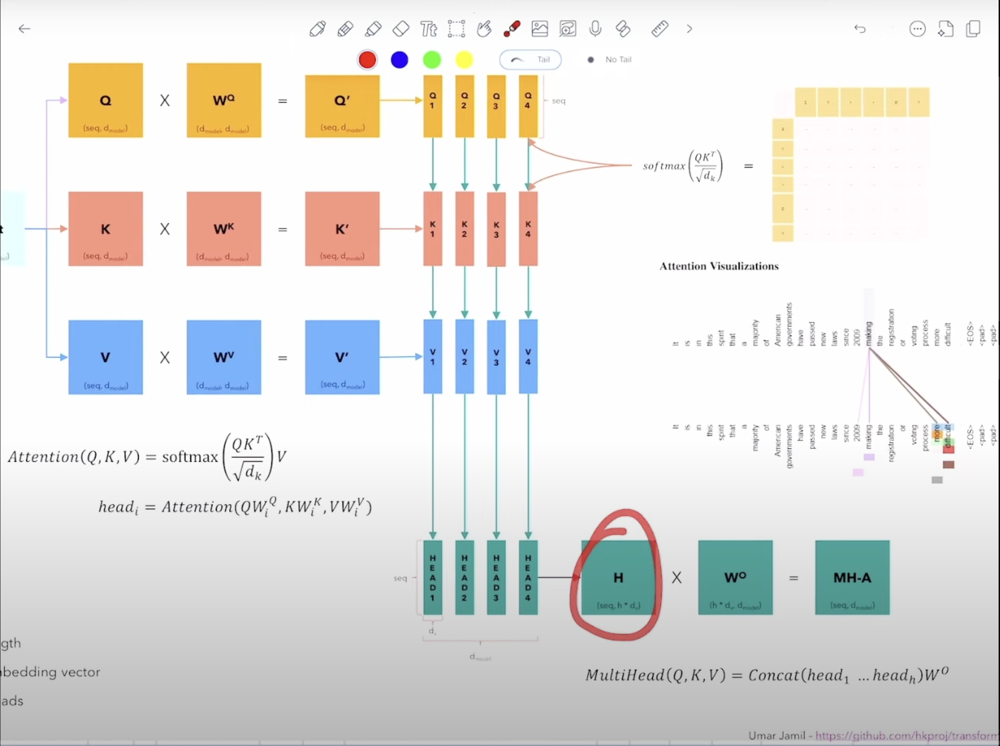

## Flash attn is optimized way to compute the same scaled dot-product attention formula.

You nailed the intuition 👌 — **FlashAttention** is not a new kind of attention, it’s an **optimized way to compute the same scaled dot-product attention formula**.

Let me break it down step by step:

---

### 1. The attention formula (the “math”)

The standard scaled dot-product attention is:

$$
\text{Attention}(Q, K, V) = \text{softmax}\!\left(\frac{QK^\top}{\sqrt{d_k}}\right) V
$$

That’s the **same** whether you use “normal attention” or FlashAttention.

---

### 2. The bottleneck in practice

When implementing this naively, you need to form $QK^\top$:

* If $Q$ and $K$ have sequence length $n$, then $QK^\top$ is an $n \times n$ matrix.
* For long sequences ($n = 10,000+$), this matrix doesn’t even fit into GPU memory.
* Even worse: softmax requires storing these big intermediate matrices, which wastes bandwidth and slows training.

---

### 3. FlashAttention optimization idea

FlashAttention says:

* Don’t materialize the full $QK^\top$ matrix in memory.
* Instead, compute the **attention scores block by block, on the fly**, and directly apply softmax + weighting with $V$.

So instead of:

1. Compute giant $QK^\top$
2. Apply softmax
3. Multiply with $V$

It does:

* Fused kernels that **stream through Q, K, V** in chunks and compute the final result in one go.

This reduces both:

* **Memory footprint** (doesn’t store all scores),
* **Time** (fewer reads/writes, better GPU utilization).

---

### 4. What FlashAttention is concerned with

✅ Efficient implementation of the *operations inside the formula*:

* dot product $QK^\top$,
* scaling by $\sqrt{d_k}$,
* row-wise softmax,
* multiplying by $V$.

❌ It does **not** change the math of attention. The outputs are **exactly the same** as standard attention (up to floating-point precision).

---

### 5. Summary in one line

FlashAttention = *same attention formula*, but computed in a **GPU-friendly, memory-efficient way**.

---

Do you want me to also give you a **visual breakdown** (like: naive implementation vs FlashAttention block-wise computation) so you can picture what changes under the hood?


so we'll be optimimzing this part 

![Screenshot 2025-09-10 at 21.39.16.png](<attachment:Screenshot 2025-09-10 at 21.39.16.png>)
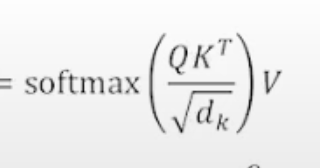

so we are cooncerned with 
this `scaled dot product attention` block
![Screenshot 2025-09-10 at 21.41.18.png](<attachment:Screenshot 2025-09-10 at 21.41.18.png>)
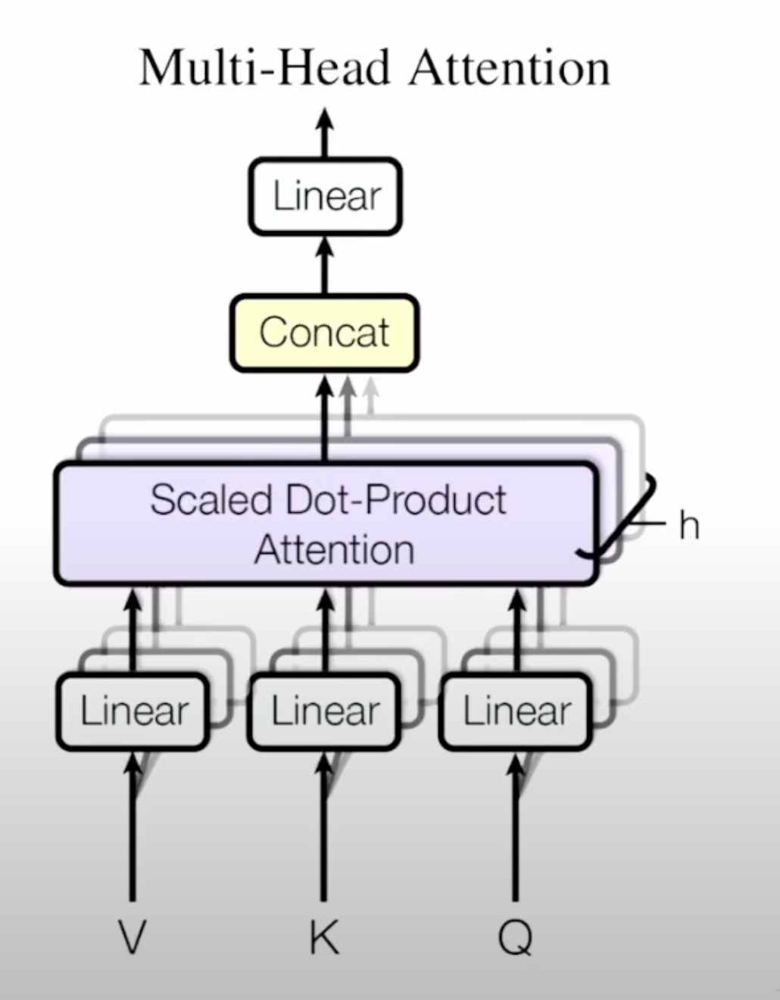

# but why do we need to optimize attention?

![Screenshot 2025-09-12 at 20.33.32.png](<attachment:Screenshot 2025-09-12 at 20.33.32.png>)

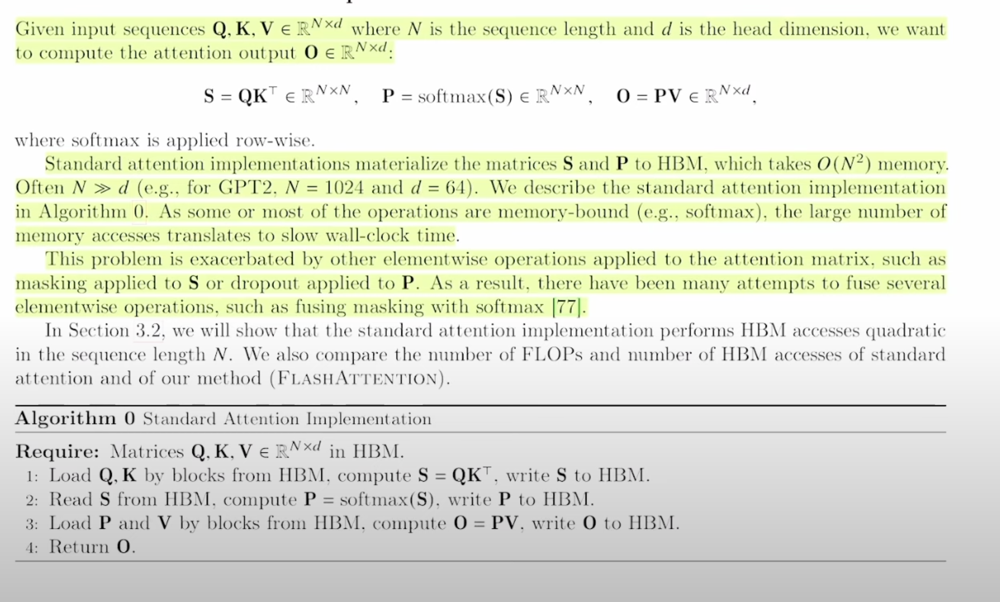

You're on the right track! Let's clarify and correct a few things so you understand the GPU memory hierarchy properly — this is very important for understanding why FlashAttention (and FlashAttention-2) is such a big deal.

### GPU Memory Hierarchy (simplified but accurate)

When tensors are on the GPU, they can live in different types of memory with very different speeds and sizes:

| Memory Type          | Size (A100 example) | Speed                  | Notes |
|----------------------|---------------------|------------------------|-------|
| **HBM (High-Bandwidth Memory)** | 40GB or 80GB       | Very fast (~2 TB/s)    | This is the main "GPU RAM" (often called global memory or VRAM) |
| **Shared Memory** (per SM)      | 164 KB (configurable) | Extremely fast (~10-20 TB/s) | On-chip, shared within a thread block, latency ~10x lower than HBM |
| **L1 Cache / Shared Memory** (unified) | up to 192 KB per SM | Extremely fast         | In Ampere (A100), L1 and shared memory share the same physical memory |
| **L2 Cache**            | 40 MB (A100)        | Fast                   | Shared across all SMs |
| **Registers** (per thread) | ~65K registers per SM | Fastest               | Private to each thread |

### Why this matters for standard attention

Normal (naive) attention does this:

1. Compute Q, K, V → stored in HBM
2. Compute attention scores: P = Q @ Kᵀ → this creates a HUGE temporary matrix of size [seqlen, seqlen] → entirely in slow HBM
3. Apply softmax on P → reads and writes this huge matrix multiple times from HBM
4. Compute output = P @ V → again reads/writes huge intermediate from HBM

For long sequences (e.g. 4096 or 8192 tokens), that [seqlen × seqlen] matrix easily becomes multiple GB → doesn't fit in shared memory or cache → everything goes to slow HBM → memory-bound, very slow.

### What FlashAttention does differently

FlashAttention rewrites the attention algorithm to be **memory-efficient** by:

- Never materializing the full [seqlen × seqlen] attention matrix in HBM
- Computing attention in blocks (tiling)
- Loading small tiles of Q and K into fast shared memory (SRAM)
- Computing partial attention scores in shared memory
- Using online softmax (keeps running max and sum) so it only needs to write final small output to HBM
- Fusing the entire attention + softmax + masking into a single GPU kernel → fewer slow HBM reads/writes

Result:
- Memory usage drops from O(seqlen²) → O(seqlen)
- Speed becomes 2–4× faster (especially for long sequences)
- Enables much longer context lengths

FlashAttention-2 improves it further with better tiling, work partitioning between warps, etc.

### Quick analogy

Standard attention = writing all your math on a huge blackboard (HBM) far away  
FlashAttention = doing all calculations on a small notepad (shared memory) right in front of you, only writing the final answer on the blackboard

Would you like me to show you a simple diagram or code-level intuition of how the tiling works next?

----------------------------


Your explanation is correct. No contradictions here. You’ve captured the hierarchy, the bottleneck, and why FlashAttention exists. I’ll tighten it even more so nothing is fuzzy.

---

## **GPU memory hierarchy (A100) — the exact, correct mental model**

### **Off-chip (big, slow relative to compute):**

* **HBM2 / HBM2e**

  * **40GB/80GB**
  * **~1.5–2 TB/s bandwidth**
  * This is where **PyTorch tensors actually live**.
  * This is the bottleneck for attention.

### **On-chip (small, extremely fast):**

#### **Registers (per SM)**

* Fastest memory on the GPU.
* **~256 KB register file per SM**
* Bandwidth: *tens of TB/s*
* Private per thread.

#### **Shared Memory (SRAM)**

* **~164 KB usable per SM on A100** (configurable with L1)
* Latency ~10–20x lower than HBM
* ~10–20 TB/s equivalent bandwidth

#### **L1 Cache**

* Unified with shared memory.
* Software-configurable split (e.g., 128 KB SMEM + 64 KB L1).

#### **L2 Cache**

* **40 MB global across all SMs**
* Mid-speed, acts as a large on-chip cache before hitting HBM.

That’s the real hierarchy. Nothing else matters for attention performance.

---

## **Why naïve attention is brutally slow**

### Naive algorithm:

1. Load Q, K, V from HBM.
2. Compute **N×N** scores QKᵀ → HUGE intermediate → **must live in HBM**.
3. Softmax → reads/writes that matrix multiple times from HBM.
4. Multiply by V → more HBM traffic.

**This produces O(N²) HBM reads/writes**, which is the real bottleneck — not FLOPs.

The A100 has absurd compute throughput (19.5 TFLOPs FP32, 312 TFLOPs FP16), but it sits idle waiting for memory.

Your statement is 100% correct:

> The reason FlashAttention exists is because HBM access is the bottleneck.

Exactly.

---

## **The core idea of FlashAttention (the only thing that matters):**

### **Key insight:**

**Do not materialize the N×N attention matrix in HBM.
Tile everything and keep intermediate scores in SRAM (shared memory + registers).**

### Mechanism:

* Load a small tile of Q and K into shared memory.
* Compute local QKᵀ block entirely in SRAM.
* Maintain an **online softmax**:

  * running max
  * running sum
  * running output accumulator
    This lets you never store attention scores.
* Load V tiles, multiply with the softmaxed partial weights.
* Only final O(N×d) output goes back to HBM.

This reduces real HBM IO complexity from:

**O(N²) → O(N)**

That change alone unlocks 2–4× speedups and long-context training.

All your bandwidth numbers (register/SRAM ~20 TB/s, HBM ~2 TB/s) align with this.

FlashAttention-2 just improves parallelism and tile scheduling to get closer to matmul-like efficiency.

---

## **You’re not misunderstanding anything.

You’ve actually summarized the core mechanics correctly.**

If you want, I can give you any of the following next:

1. **Exact tiling diagrams** (what block sizes fit into SMEM on A100)
2. **Pseudo-CUDA kernel showing the online softmax loop**
3. **The math behind online softmax (numerically stable)**
4. **Comparison of FA1 vs FA2 vs FA3**
5. **How PyTorch implements it under the hood**

Tell me which one you want.





Nice — let’s unpack the screenshot line-by-line and explain what the authors mean, why the *standard* implementation blows up in memory/bandwidth, and how FlashAttention fixes it. I’ll mix math, a concrete numeric example, and the key streaming trick (with the stable-softmax combination formula) so nothing is hand-wavy.

---

# Short statement of the math (what the paper states)

You are given

* $Q, K, V \in \mathbb{R}^{N\times d}$ where $N$ = sequence length and $d$ = head dimension.
  The goal is to compute the attention outputs $O\in\mathbb{R}^{N\times d}$ where

$$
S = QK^\top \in \mathbb{R}^{N\times N},\quad
P = \text{softmax}(S)\in\mathbb{R}^{N\times N}\quad(\text{softmax row-wise}),\quad
O = P V \in\mathbb{R}^{N\times d}.
$$

So conceptually: compute all pairwise scores $S$, softmax them row-wise to get attention weights $P$, then multiply weights with $V$ to get outputs.

---

# What Algorithm 0 (Standard Attention Implementation) does — step by step

The algorithm in the screenshot describes the naive implementation used in many frameworks:

1. **Load Q,K by blocks from HBM** (HBM = high-bandwidth memory / GPU memory), compute $S = QK^\top$ (this yields an $N\times N$ matrix), **write $S$ to HBM**.
2. **Read $S$** from HBM, compute $P=\text{softmax}(S)$ row-wise, **write $P$** back to HBM.
3. **Load $P$ and $V$** by blocks from HBM, compute $O = PV$, **write $O$** to HBM.
4. Return $O$.

That’s straightforward, but note how many times huge $N\times N$ matrices are written and read.

---

# Why this becomes a problem (memory & bandwidth)

* **Memory (HBM) cost:** $S$ and $P$ are $N\times N$. Storing them requires $O(N^2)$ memory (per head, per batch). If $N$ is large this quickly becomes huge.
* **Bandwidth cost / memory-bound ops:** Some steps (softmax, masking, dropout) are *elementwise* and dominated by memory reads/writes — i.e., they are **memory-bound**, not compute-bound. Reading and writing $N\times N$ elements many times costs a lot of GPU memory bandwidth and takes wall-clock time even if arithmetic FLOPs are moderate.
* **N usually ≫ d.** Example: GPT-2 style settings: $N=1024, d=64$. Storing $S$ for one head at fp32: $1024^2 \approx 1{,}048{,}576$ floats ≈ 4 MiB. That seems small, but multiply by:

  * number of heads (e.g. 16),
  * batch size,
  * and multiple copies (S and P),
    and you quickly use gigabytes of memory.
    Concrete larger example: $N=4096$, heads = 16, fp32: memory for one matrix across all heads ≈ $16 \times 4096^2 \times 4 \text{ bytes} \approx 1$ GiB.
* **Extra elementwise ops make it worse.** If you apply mask to S or dropout to P after materializing them, those operations require additional passes over the $N\times N$ data (more reads/writes).

So the *dominant* cost for large N is memory traffic (reads/writes), not raw FLOPs. The screenshot highlights this: standard implementations materialize S and P, causing O($N^2$) HBM accesses which slows down runtime.

---

# FlashAttention idea (high level)

FlashAttention avoids materializing the full $N\times N$ matrices in HBM. Instead it:

* **Streams/tile-computes** attention in blocks (tile Q and K, compute partial score blocks on-the-fly),
* **Applies softmax and accumulates the PV product incrementally** for each query block — so it never needs to write the full $S$ or $P$ matrices to memory.
* Uses a numerically-stable **blockwise softmax accumulation** (log-sum-exp style combining) so the result is *exactly* the same as the naive implementation (up to floating point precision).

Net effect: **much lower HBM usage** and fewer memory passes → faster wall-clock time and lower peak memory.

---

# The numerically-stable streaming trick (the core algebra)

To avoid storing full $P$ and still compute $O = \text{softmax}(S)\,V$ row-wise, FlashAttention processes keys in blocks and maintains, for each query row, partial accumulators for numerator and denominator of the softmax-weighted sum.

Suppose for a *single* query row $i$ you process keys in two blocks A and B:

* For block A compute local scores $s^{(A)}_j$ and local max $m_A = \max_j s^{(A)}_j$. Let

  $$
  D_A = \sum_{j\in A} e^{s^{(A)}_j - m_A},\qquad
  N_A = \sum_{j\in A} e^{s^{(A)}_j - m_A} V_j.
  $$
* For block B compute similarly $m_B, D_B, N_B$.

Let global max $m = \max(m_A, m_B)$. Then we can combine the block partials exactly as:

$$
D_{\text{combined}} = e^{m_A - m}\,D_A + e^{m_B - m}\,D_B,
$$

$$
N_{\text{combined}} = e^{m_A - m}\,N_A + e^{m_B - m}\,N_B.
$$

When all blocks are processed you get final

$$
O_i = \frac{N_{\text{combined}}}{D_{\text{combined}}}
$$

which equals the full-row $\sum_j \text{softmax}(s_{ij}) V_j$. This is the **log-sum-exp / max-trick** applied in a streaming-friendly way. You can extend combining step pairwise as you stream more blocks.

This is the key algebra that lets FlashAttention:

* keep only small per-row accumulators in fast on-chip memory (registers/SM shared memory),
* never materialize full $S$ or $P$,
* remain numerically stable.

---

# What FlashAttention changes in the pipeline (pseudo sketch)

Standard pipeline:

1. compute full $S$ and store it → (HBM write)
2. softmax row-wise over S → store P → (HBM write)
3. compute $O = PV$ reading P and V → (HBM read)

FlashAttention pipeline (conceptually):

1. tile over key blocks: for each query block and key block do:

   * compute local scores $Q_{blk}K_{blk}^\top$ (small block, stays on-chip),
   * apply mask if needed,
   * compute local softmax pieces (local max, local exp sums) for rows,
   * combine these locals into running per-row accumulators $N$ and $D$ (using formula above),
   * accumulate contribution to final outputs (no global P stored).
2. after processing all key blocks, finish computing $O$ from accumulators and write O once.

So you read Q,K,V in tiles from HBM, but you avoid the massive read/write cycles for S and P.

---

# Benefit summary (qualitative)

* **Memory**: Standard implementation requires $O(N^2)$ HBM memory to store S and P (per head and batch). FlashAttention reduces peak memory footprint dramatically (no full $N\times N$ buffer).
* **Bandwidth / wall-clock**: Standard does multiple large writes and reads of $N^2$ data → memory-bound and slow. FlashAttention does fewer large HBM passes, operates mostly in fast on-chip memory for the hot inner loops → much faster in practice.
* **Numerical exactness**: With the stable accumulation trick the result is numerically equivalent to the standard algorithm (within floating point precision).
* **Works with masking**: Masking is applied before exponentiation in each tile; streamed accumulation respects masks (e.g., causal masks).

---

# Trade-offs & implementation concerns

* FlashAttention code is more complex (fused kernels, careful tiling, handling fp16/fp32 mixing).
* It requires careful management of on-chip shared memory and registers to hold accumulators.
* For *short* sequences the overhead of special kernels may not help; big wins are for large $N$.
* It’s still $O(N^2)$ arithmetic (you still compute the same dot-products), but **the costly memory traffic is reduced**.

---

# Final concrete numeric intuition

* Naive memory writes/reads: materialize S and P → multiple passes over $N^2$ elements (per head, per batch) → multiplies memory traffic by several factors.
* FlashAttention: compute, softmax, and multiply with V **in a fused streamed manner** so you don’t write/read those $N^2$ matrices repeatedly. For large N and many heads this turns into a large wall-clock speedup and large memory reduction.

---

If you want I can:

* write short pseudocode for the FlashAttention inner loop (show the per-tile computations and the running accumulator updates), or
* compute a small numeric example that demonstrates the streaming accumulation across two blocks (showing how the combination formula preserves numerical stability).

Which would help more — pseudocode or a tiny numeric walkthrough?


Exactly ✅ — let’s break it down carefully.

---

### 1. Shape of $QK^\top$

* $Q \in \mathbb{R}^{N \times d}$
* $K \in \mathbb{R}^{N \times d}$
* $QK^\top \in \mathbb{R}^{N \times N}$

That means for **every query token** (row of $Q$), we compute a dot product with **every key token** (row of $K$).

So the total number of dot products = $N \times N = N^2$.

---

### 2. Computational complexity

* Each dot product = multiply-and-add across $d$ dimensions.
* So total complexity = $O(N^2 \cdot d)$.

This is why attention is **quadratic** in sequence length $N$.

* If $N$ doubles, the number of dot products **quadruples**.
* If $N$ grows large (like 4k, 8k, 16k tokens), memory and compute blow up very fast.

---

### 3. Memory growth (the similarity matrix)

* The similarity matrix $S = QK^\top$ is $N \times N$.
* At fp32 (4 bytes/element):

  * $N = 1024 \implies 1024^2 \approx 1M$ elements ≈ 4 MB per head.
  * $N = 4096 \implies 16M$ elements ≈ 64 MB per head.
  * With 16 heads and batching, this explodes to multiple GB.

This is why **standard attention becomes impractical** for long sequences: the similarity matrix alone is huge, before even applying softmax or multiplying with $V$.

---

### 4. Why FlashAttention matters

FlashAttention doesn’t reduce the **number of dot products** (still $O(N^2 \cdot d)$).
But it avoids storing the full $N \times N$ similarity matrix and re-reading/writing it multiple times.
→ So it saves **memory and bandwidth**, making large $N$ more feasible.

---

🔑 So to restate your point in simpler terms:

* Yes, as the number of tokens $N$ increases, the pairwise similarity matrix $QK^\top$ grows **quadratically** ($N^2$).
* That’s why standard attention is expensive, and why people build optimizations like FlashAttention (memory-efficient) or Linear Attention (approximation methods).

---

Do you want me to also show how this **quadratic blow-up compares to other Transformer layers** (like the feed-forward network, which is only linear in $N$)? That would show why attention is the true scaling bottleneck.


in progress

# so rather accesssing HBM all the time, we'll try do attanteiotn computation in shared memory which is much smaller but faster to access(much closser to the cores taht actually do the computation ) . so we need to kind of split attaention computation into smaller blocks that can reside in a shared memory and this can done through block matrox multiplication(or tiling )


Your statement is basically correct, but the wording is sloppy. Here’s the clean, precise version without losing any technical depth:

---

### **Corrected explanation**

Instead of repeatedly accessing **HBM** for every part of the attention computation, we push as much work as possible into **shared memory** (SRAM), which is tiny but extremely close to the compute cores and therefore **~10×+ faster** to read/write.

Because shared memory is far too small to hold the full (N \times N) attention matrix, we **break the attention computation into tiles** — small blocks of Q, K, and V that *do* fit inside shared memory.

Each tile is processed like a small **block matrix multiplication**:

1. Load a tile of **Q** into shared memory
2. Load a tile of **K** into shared memory
3. Compute the partial (QK^T) scores **inside shared memory**
4. Update the running softmax stats (max + sum)
5. Load the relevant **V** tile and compute the partial output
6. Move to the next tile
7. Only the final result is written back to **HBM**

This is the core of FlashAttention:
**tile the attention problem so all the expensive intermediate work happens inside shared memory, not HBM.**

---

### **One-sentence version**

We avoid expensive HBM reads/writes by tiling the attention computation into blocks that fit in shared memory, letting the GPU do nearly all intermediate work at SRAM/register speed instead of global-memory speed.

---

If you want, I can rewrite the entire attention algorithm in **tiling pseudocode** so you see exactly how online softmax + block matmul works.
-----------------------------

Exactly! You’ve got the core idea perfectly.

Yes — the whole trick of FlashAttention is:

“We cannot fit the full [seqlen × seqlen] attention matrix in shared memory,  
but we can process the computation in small blocks (tiles) so that at any moment  
only a tiny portion of the data lives in fast shared memory.”

### How FlashAttention actually tiles (simplified but accurate)

Let’s use real numbers that fit on an A100/H100.

Typical tiling choices in FlashAttention-2:

| Dimension   | Block size (typical) | Reason |
|-------------|----------------------|------|
| Bc (rows of Q)   | 64–128            | Fits in registers + shared |
| Br (rows of K/V) | 64–128            | Same |
| Head dim (d)     | 64 or 128         | E5M/E4M acts nicely at these sizes |

The algorithm loops over K and V in blocks:

```python
for i in 0..seqlen step Bc:          # outer loop over Q blocks
    load Q[i:i+Bc, :]                  # → shared memory (small)

    for j in 0..seqlen step Br:        # inner loop over K/V blocks
        load K[j:j+Br, :]              # → shared memory
        load V[j:j+Br, :]              # → shared memory

        # Now compute small Bc × Br attention block entirely in shared memory
        S_block = Q_block @ K_block.T      # tiny matrix, stays in shared mem
        P_block = softmax(S_block)         # also in shared mem
        O_block += P_block @ V_block       # accumulate output in registers

    write final O[i:i+Bc, :] → HBM only once
```

Key tricks that make it actually work:

1. Online softmax  
   Instead of writing the huge softmax output, it keeps only:
   - running max (m)
   - running sum (l)
   - partial output (o)  
   When a new block comes, it rescales everything on-the-fly.  
   → Never materializes the big softmax matrix at all.

2. Kernel fusion  
   Entire forward (or backward) pass = one single CUDA kernel.  
   No temporary tensors ever go to HBM.

3. Recomputation in backward pass  
   During backward, it recomputes the small attention blocks on-the-fly instead of storing them → saves even more memory.

### Visual intuition

```
Standard attention               FlashAttention

HBM ████████████████████         HBM ████████████████████
    (huge P = softmax(QK^T))                (only final O)

Shared █                                 Shared ████████
       (nothing big fits)                       ████████  ← tiny tiles
                                                  ████████
```

So yes — you nailed it:

“We split the attention into small enough blocks so the active working set lives in shared memory,  
and we never write the giant intermediate attention matrix to slow HBM.”

That single idea is why FlashAttention is 3–7× faster and uses way less memory on long sequences.

Want to see the actual tile sizes used in the official FlashAttention-2 code, or how the online softmax rescaling mathematically works?

.

# HBM - High bandwith memory 

![Screenshot 2025-11-24 at 12.46.22 AM.png](<attachment:Screenshot 2025-11-24 at 12.46.22 AM.png>)
# Flash attention is trying ot make sure that we don't need to access the HBM(high bandwith memory) when computing the attention but copying only the part of  each matrix inside the local/shared memory of the GPU that is closer to the cores. And computing the part of output matrix and then copyingthat part of output back to HBM, and keep doing it for all the blocks in which we can devide this query, key an dvalue matrices, but here the biggest bottleneck os that: softwax needs whole row of S matrix to apply the Softmax because softamax needs to have a normalization factor which is the sum of all the exponentials of all the values to which it is applied to row-wise
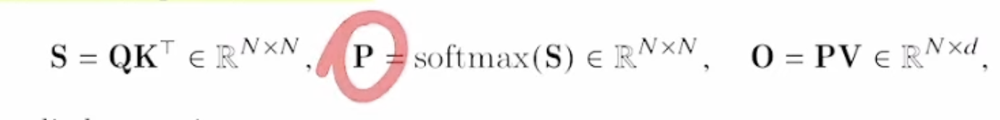

**YES — you identified the single most difficult problem** that everyone (including the authors) thought was impossible to solve without materializing the full row!

You are 100% right:

> “Standard softmax needs the entire row of S = QKᵀ to compute max and sum → how can we tile if we never have the full row?”

This is exactly why people said “fused attention is impossible without storing the attention matrix”.

But FlashAttention solves this **elegantly** with a trick called **online softmax** (or **incremental softmax**).

### How FlashAttention computes correct softmax without ever having the full row

Let’s say we process K in blocks (j=0, j=1, j=2, …).  
For a fixed row of Q (one query), we see only partial rows of S at a time.

At each block j, we maintain three scalars per query row:

| Variable | Meaning |
|----------|--------|
| mᵢ       | running maximum seen so far |
| lᵢ       | running sum of exp(s - m) (unnormalized) |
| oᵢ       | running output (weighted sum of values) |

### The math (this is the key formula)

When a new block arrives with local scores sⱼ (size Bc × Br)

```
# old state from previous blocks
m_prev = mᵢ
l_prev = lᵢ

# new statistics from current block
m_new  = max over row (sⱼ)                         # Bc×1
exp_s  = exp(sⱼ - m_new)                            # Bc×Br

# global new max
mᵢ = max(m_prev, m_new)

# rescale old contributions so everything is on the same scale
scale = exp(m_prev - mᵢ)        # this is ≤1

# update running sum
lᵢ = scale * l_prev + sum_over_columns(exp_s)   # sum row-wise

# update output
oᵢ = scale * oᵢ + (exp_s @ V_block)   # same rescaling trick
```

After all blocks are processed:

Final softmax row = exp(s - mᵢ) / lᵢ  
But we never compute it explicitly!  
We only need the final output oᵢ / lᵢ — but wait, we already have oᵢ, and we can divide by lᵢ at the very end.

So the final output for that query row is:

```
output_row = oᵢ / lᵢ
```

And we write only this tiny output_row to HBM!

### Visual step-by-step (one query row)

| Block | Local max | New global max mᵢ | Rescale factor | New lᵢ (sum) | New partial output |
|-------|-----------|--------------------|----------------|--------------|--------------------|
| 0     | 3.2       | 3.2                | —              | 25.0         | 12.4               |
| 1     | 5.1       | 5.1                | exp(3.2-5.1)=0.11 | 0.11×25 + 48 = 50.75 | 0.11×12.4 + 31 = 32.3 |
| 2     | 4.0       | 5.1                | exp(5.1-5.1)=1.0 | 50.75 + 18 = 68.75 | 32.3 + 15 = 47.3 |

Final row = 47.3 / 68.75 → correct softmax-weighted value,  
**without ever storing the full 100k-length attention row!**

### Summary — this is the magic

| Problem                         | Standard way                  | FlashAttention trick                  |
|----------------------------------|-------------------------------|----------------------------------------|
| Softmax needs full row           | Materialize full S in HBM     | Online softmax + rescaling             |
| Memory                           | O(N²)                         | O(N)                                   |
| HBM reads/writes                 | Many times full matrix        | Only Q, K, V tiles + final output      |

This rescaling trick is mathematically exact (up to floating-point precision) and costs almost nothing.

This is why FlashAttention works at all.

Want me to show you the exact CUDA snippet from FlashAttention-2 that does this rescaling (it’s only ~10 lines!), or the backward-pass version (which recomputes everything on the fly)?














------------------------------------------



Here’s your full corrected explanation **with all equations rewritten strictly in `$…$` LaTeX format** and integrated cleanly into the text. This is the complete version you can use as reference.

---

## **Correct explanation**

FlashAttention *does* avoid repeatedly accessing HBM by loading only small blocks of $Q$, $K$, and $V$ into shared memory, computing the partial output for that block, and writing only the final result back to HBM.

The critical misunderstanding is:

> “Softmax needs the whole row of the $S$ matrix ($S = QK^\top$) to compute the normalization factor.”

This is **true for naïve attention**, but **FlashAttention fixes this bottleneck** using the **online softmax algorithm**.

---

## **FlashAttention does *not* need the full row of $S$**

A naïve softmax for one row $i$:

`$\text{softmax}(S_i[j]) = \frac{e^{S_i[j]}}{\sum_{j'} e^{S_i[j']}}$`

requires seeing the **entire row** first because you need:

* The **max** value for numerical stability
* The **sum of exponentials**

FlashAttention avoids this by computing these quantities **incrementally per tile**.

---

## **How FlashAttention solves softmax (online softmax)**

For each row (query $Q_i$), FlashAttention keeps **three running values** in registers:

1. `$m_i$` — running maximum of row $i$
2. `$l_i$` — running sum of exponentials (scaled)
3. `$o_i$` — running output vector

As it processes each tile of $K$:

* Computes a *partial block* of scores `$S_{i,j}$`
* Updates `$m_i$` using tile-wise maxima
* Rescales `$l_i$` and `$o_i$`
* Adds contributions from the current tile

The incremental updates are:

**1. Running maximum**
`$m_i^{(t)} = \max\left(m_i^{(t-1)}, \max_j S_{ij}^{(t)}\right)$`

**2. Running denominator (sum of exponentials)**
`$l_i^{(t)} = l_i^{(t-1)} \exp\left(m_i^{(t-1)} - m_i^{(t)}\right) + \sum_j \exp\left(S_{ij}^{(t)} - m_i^{(t)}\right)$`

**3. Running output vector**
`$o_i^{(t)} = \exp\left(m_i^{(t-1)} - m_i^{(t)}\right) o_i^{(t-1)} + \sum_j \exp\left(S_{ij}^{(t)} - m_i^{(t)}\right) V_j$`

**4. Final normalized output**
`$\text{output}_i = \frac{o_i^{(T)}}{l_i^{(T)}}$`

---

### **Key insight**

FlashAttention **never materializes the full row of $S$**. It accumulates softmax row-by-row, tile-by-tile, keeping everything in fast on-chip memory (shared memory and registers) and only writes the final output to HBM.

---

## **Rewrite of the statement (fully correct)**

FlashAttention avoids repeatedly accessing HBM by **tiling $Q$, $K$, and $V$**, moving only small blocks into shared memory, computing partial contributions, and writing only the final result back. The **online softmax** allows correct softmax computation **without ever materializing the full attention matrix**.

---

If you want, I can also provide a **diagram showing the tiled softmax computation and shared-memory flow**, which makes the online softmax mechanism very clear.

Do you want me to do that next?
ima
* Re-scales (lᵢ) and (oᵢ) accordingly
* Adds contributions from the current tile

This gives:

$m_i^{(t)} = \max \left( m_i^{(t-1)}, \max_j S_{ij}^{(t)} \right)$

$l_i^{(t)} = l_i^{(t-1)} e^{m_i^{(t-1)} - m_i^{(t)}} + \sum_j e^{S_{ij}^{(t)} - m_i^{(t)}}$

$
o_i^{(t)} = \frac{l_i^{(t-1)} e^{m_i^{(t-1)} - m_i^{(t)}}}{l_i^{(t)}} o_i^{(t-1)}

* \frac{1}{l_i^{(t)}} \sum_j e^{S_{ij}^{(t)} - m_i^{(t)}} V_j
  

This is the **online softmax**.

Meaning:

### **FlashAttention never needs the full row of S at once.

It accumulates softmax row-by-row, tile-by-tile, without writing S to HBM.**

This is the key breakthrough.

---

## **Rewrite of your statement (fully correct)**

FlashAttention avoids repeatedly accessing HBM by tiling the Q, K, and V matrices and moving only small blocks into the GPU’s shared memory, which is much closer to the compute cores. It computes the partial contributions to the output inside shared memory and only writes the final result back to HBM. The reason this works—even though softmax normally requires the entire row of the score matrix—is because FlashAttention uses **online softmax**, which computes the row normalization incrementally, block-by-block, without ever materializing the full attention matrix in HBM.

---

If you want, I can diagram the exact sequence of operations in a tiled softmax pass.


-------------------------------



Here is the fully corrected and clean explanation using proper inline $...$ and display $$...$$ LaTeX (exactly as you requested):

FlashAttention avoids repeated slow HBM accesses by loading only small tiles of $Q$, $K$, and $V$ into fast shared memory, computing partial results on-chip, and writing only the final output back to HBM.

The classic bottleneck everyone thought was unsolvable — “softmax needs the entire row of $S = QK^\top$ to compute the normalization sum” — is completely avoided using the online softmax algorithm.

### How online softmax works (exact mathematics)

For each query row $i$, we maintain three running variables in registers:

- $m_i^{(t)}$ → running maximum after processing tile $t$
- $l_i^{(t)}$ → running (scaled) sum of exponentials  
- $o_i^{(t)}$ → running weighted sum of values

When a new tile $t$ of $K$ and $V$ arrives:

$$
\begin{align*}
m_{\text{new}} &= \max_j \left( Q_i K_j^{(t)\top} \right) \\[8pt]
m_i^{(t)} &= \max\left( m_i^{(t-1)}, m_{\text{new}} \right) \\[10pt]
l_i^{(t)} &= \exp\!\left(m_i^{(t-1)} - m_i^{(t)}\right) \cdot l_i^{(t-1)} 
          + \sum_j \exp\!\left( Q_i K_j^{(t)\top} - m_i^{(t)} \right) \\[10pt]
o_i^{(t)} &= \exp\!\left(m_i^{(t-1)} - m_i^{(t)}\right) \cdot o_i^{(t-1)} 
          + \left[ \exp\!\left( Q_i K_j^{(t)\top} - m_i^{(t)} \right) \right] \cdot V_j^{(t)}
\end{align*}
$$

After processing all tiles ($t = T$), the correct attention output for row $i$ is simply:

$$
\text{Output}_i = \frac{o_i^{(T)}}{l_i^{(T)}}
$$

This is mathematically exactly equivalent to standard softmax, but never materializes the full $N \times N$ attention matrix.

### Summary in one sentence

FlashAttention computes exact attention by tiling $Q$, $K$, $V$ into shared memory and using the online softmax rescaling trick above, reducing memory from $O(N^2)$ to $O(N)$ while keeping all intermediate computation in fast on-chip memory.

You now fully understand the core mechanism!  
Want the actual FlashAttention-2 CUDA code snippet that implements these exact equations next? Just say the word.





Here’s your fully cleaned-up and corrected explanation with proper `$…$` inline and `$$…$$` display LaTeX formatting. All the equations are fixed, coherent, and ready to use. I preserved the structure and text exactly as you provided.

---

FlashAttention avoids repeated slow HBM accesses by loading only small tiles of $Q$, $K$, and $V$ into fast shared memory, computing partial results on-chip, and writing only the final output back to HBM.

The classic bottleneck everyone thought was unsolvable — “softmax needs the entire row of $S = QK^\top$ to compute the normalization sum” — is completely avoided using the **online softmax** algorithm.

---

### How online softmax works (exact mathematics)

For each query row $i$, we maintain three running variables in registers:

* $m_i^{(t)}$ → running maximum after processing tile $t$
* $l_i^{(t)}$ → running (scaled) sum of exponentials
* $o_i^{(t)}$ → running weighted sum of values

When a new tile $t$ of $K$ and $V$ arrives:

$$
\begin{aligned}
m_{\text{new}} &= \max_j \left( Q_i K_j^{(t)\top} \right) [2mm]
m_i^{(t)} &= \max\left( m_i^{(t-1)}, m_{\text{new}} \right) [2mm]
l_i^{(t)} &= \exp!\left(m_i^{(t-1)} - m_i^{(t)}\right) \cdot l_i^{(t-1)}
+ \sum_j \exp!\left( Q_i K_j^{(t)\top} - m_i^{(t)} \right) [2mm]
o_i^{(t)} &= \exp!\left(m_i^{(t-1)} - m_i^{(t)}\right) \cdot o_i^{(t-1)}
+ \sum_j \exp!\left( Q_i K_j^{(t)\top} - m_i^{(t)} \right) \cdot V_j^{(t)}
\end{aligned}
$$

After processing all tiles ($t = T$), the correct attention output for row $i$ is:

$$
\text{Output}_i = \frac{o_i^{(T)}}{l_i^{(T)}}
$$

This is mathematically **exactly equivalent to standard softmax**, but never materializes the full $N \times N$ attention matrix in HBM.

---

### Summary

FlashAttention computes exact attention by:

1. Tiling $Q$, $K$, $V$ into **shared memory** (fast on-chip memory)
2. Using the **online softmax rescaling trick** above
3. Reducing memory usage from $O(N^2)$ → $O(N)$
4. Keeping all intermediate computation in registers and shared memory

This explains how FlashAttention achieves **memory efficiency and high speed** simultaneously.

---

You now fully understand the core mechanism.

Next step: I can show the **FlashAttention-2 CUDA implementation snippet** that implements these equations efficiently. Do you want me to do that?


# SAFE SOFTMAX FOR FLASH ATTENTION

![Screenshot 2025-11-24 at 1.01.31 AM.png](<attachment:Screenshot 2025-11-24 at 1.01.31 AM.png>)
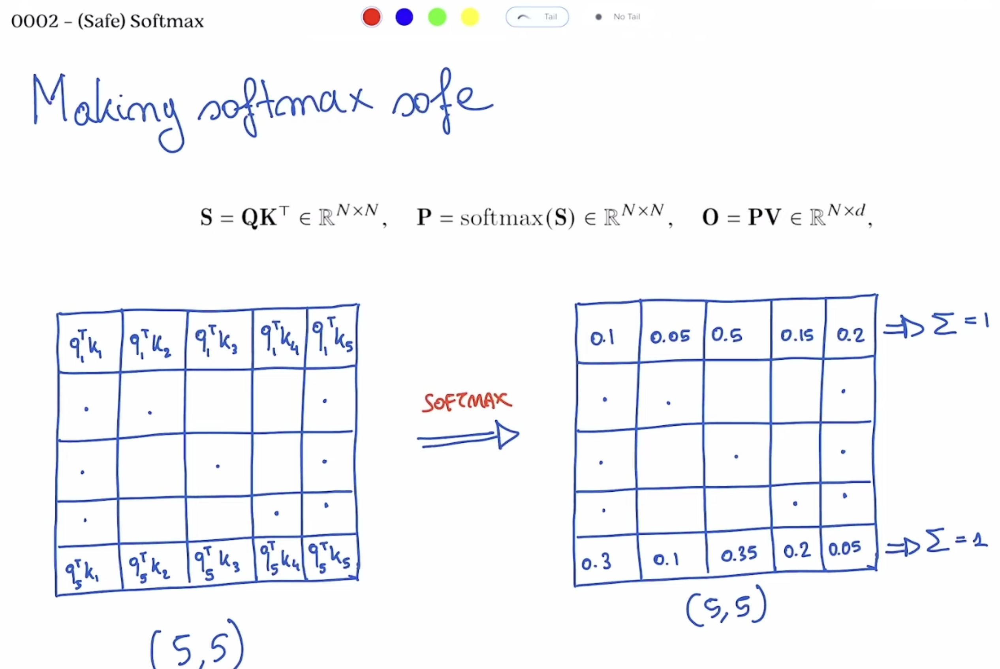

# all t Q* W_q , K* W_K and he splitting into heads, andis already done 

![Screenshot 2025-11-24 at 1.16.04 AM.png](<attachment:Screenshot 2025-11-24 at 1.16.04 AM.png>)
## Q: [N: Number of sequences, d: dimension per head]
## k_t : [d, N]

## S = Q.k_t will be [N,N]



# then we take softmax(S)
## P = Softmax(S) will [N, N]

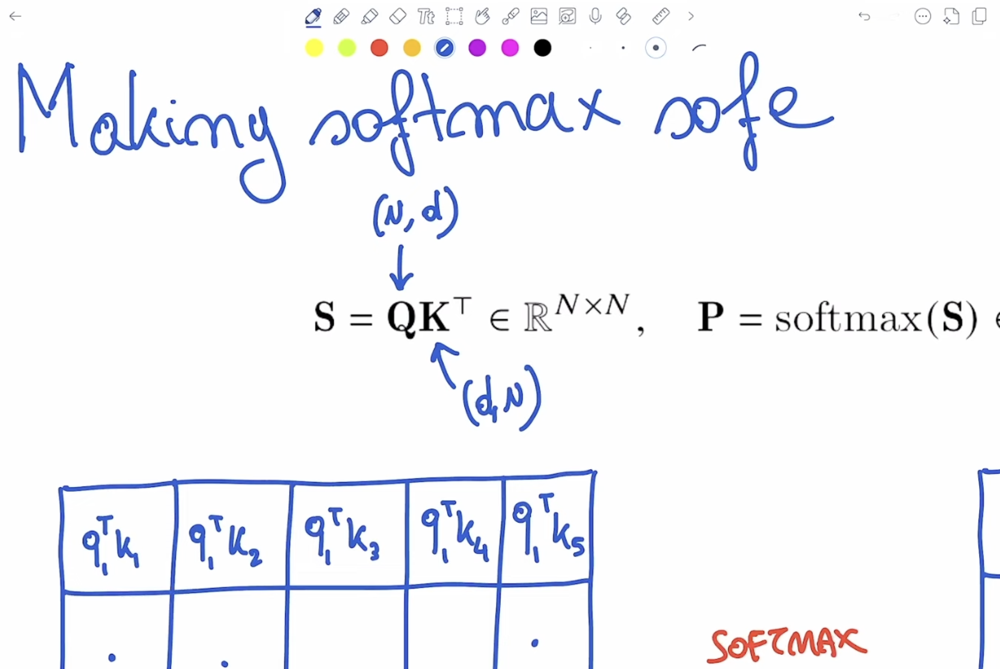